In [1]:
from matplotlib.pyplot import *
import numpy as np
import h5py
from Data_Core.experiment import *
from Data_Core.digital_twin import *
from tqdm import tqdm
#from src.algorithms import *
#import torch
import sklearn
%load_ext autoreload
import scipy

In [2]:
#find_index = lambda wavelenghts, w : np.argmin(np.abs(wavelenghts - w))

def find_index(wavelenghts,w):
    return np.argmin(np.abs(wavelenghts - w))

In [3]:
def Raman_data_loader(filename):

    with h5py.File(filename, 'a') as output_file:
         
        properties = output_file['properties']
        
        exp_properties = {'step_size' : np.array(properties['step_size'])[0],
                          'speed' : np.array(properties['speed']),
                          'n_points' : np.array(properties['n_points'])
            }
        
        wavelengths = np.array(output_file['properties']['x_data'])
        
        
        spot_numbers = [int(s.split('_')[-1]) for s in list(output_file['data'].keys()) if 'spot' in s ]
        
        Nx,Ny = output_file['properties']['n_points'][0], output_file['properties']['n_points'][1]
        Nl = len(wavelengths)
        spectral_signal = np.zeros([Nx,Ny,Nl])
        
        
        for _i, spot_number in enumerate(spot_numbers):

            ix, iy = int(spot_number//Ny), int(spot_number%Ny)
            
            spot = 'spot_'+str(spot_number)
            data = np.array(output_file['data'][spot]['raw_data'])
                      
            spectral_signal[ix,iy,:] = data
            

    return spectral_signal, wavelengths, exp_properties

In [4]:
filename = "2023913_1110.h5"
#filename = "2023811_1451.h5"
spectrum_raman, wavelengths_raman, exp_properties = Raman_data_loader(filename)

In [5]:
exp_properties

{'step_size': 0.2,
 'speed': array([b'5.000', b'5.000'], dtype=object),
 'n_points': array([250, 100])}

In [6]:
from scipy import sparse
from scipy.sparse.linalg import spsolve

def baseline_als_optimized(y, lam, p, niter = 10):
    L = len(y)
    D = sparse.diags([1, -2, 1],[0, -1, -2], shape = (L, L - 2))
    D = lam * D.dot(D.transpose()) # Precompute this term since it does not depend on `w`
    w = np.ones(L)
    W = sparse.spdiags(w, 0, L, L)
    for i in range(niter):
        W.setdiag(w) # Do not create a new matrix, just update diagonal values
        Z = W + D
        z = spsolve(Z, w*y)
        w = p * (y > z) + (1 - p) * (y < z)
    return z

In [7]:
lam = 1e2
p = 1e-1
    
pro_data = 1*spectrum_raman
for i in tqdm(range(0, pro_data.shape[0])):
    for j in range(0, pro_data.shape[1]):
        # print(i,j,end='\r')
        spec = 1 * pro_data[i, j, :]
        pro_data[i, j, :] = spec - baseline_als_optimized(spec, lam = lam, p = p, niter = 10)

100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [10:22<00:00,  2.49s/it]


In [8]:
pro_data_norm=pro_data.copy()
for i in range(0,pro_data.shape[0]):
    for j in range(0,pro_data.shape[1]):
        spec = 1 * pro_data[i,j, :]
        sum_spec=np.sum(spec)
        pro_data_norm[i,j,:]=spec/sum_spec

In [9]:
offset_l = 31
offset_m = 328

mask = pro_data_norm[:, :, offset_l:offset_m].reshape(pro_data.shape[0]*pro_data.shape[1], -1)

# threshold = 120
# threshold2 = 0.01

# # Scaled to max value for each wavenumber
# # masks = np.array([mask[:, i]*(mask[:, i] > threshold)/np.max(mask[:, i]) for i in range(mask.shape[-1])])
# masks = np.array([np.array((mask[:, i]/np.max(mask[:, i]))*((mask[:, i] > threshold)) > threshold2, dtype = int) for i in range(mask.shape[-1])])

In [10]:
threshold = 1.27e-9

mask_offset = np.array(mask)
mask_t = np.array([(mask_offset[:, i])*((mask_offset[:, i] > threshold)) for i in range(mask_offset.shape[-1])])

In [11]:
spectrum_raman.shape

(250, 100, 1024)

In [12]:
mask_t.shape

(297, 25000)

In [13]:
mask_min_max = np.array([(mask_t[i, :] - mask_t[:, :].min()+ 1e-5)/(mask_t[:, :].max() - mask_t[:, :].min() + 1e-5) for i in range(mask_t.shape[0])])

In [14]:
def read_ref(mineral):
    df = pd.read_csv(mineral + '_raman.txt',header=13,names=['wavenumber','int'],skipfooter=4,engine='python' )
    return np.array(df['wavenumber']),np.array(df['int'])

In [15]:
entropy_masks=mask_min_max*255

## Cálculo da entropia

In [16]:
def entropy_calc(map_gr,lim=255):
    import cv2
    from scipy.stats import entropy

    #image

    _bins = 200

    hist, _ = np.histogram(map_gr, bins=_bins, range=(0, lim))

    prob_dist = hist / hist.sum()
    image_entropy = entropy(prob_dist, base=2)
    return image_entropy

In [17]:
offset_l = 31
offset_m = 328
wavelengths_raman.shape
wavelengths=wavelengths_raman[offset_l:offset_m]

minerals = {
    
    'Albite':[508.1],
    'Background':[733.1],
    'Petalite':[491.3],
    'Quartz':[463.92],
    'Spodumene':[704.5]}

mineral_list = list(minerals.keys())

find_index = lambda wavelenghts,w : np.argmin(np.abs(wavelengths-w))

significant_w=[]
for i,mineral in enumerate(mineral_list):
    wn=find_index(wavelengths,minerals[mineral][0])
    significant_w.append(wn)

In [18]:
image_entropy=[]
for i in range(297):
    map_gr=entropy_masks[i]
    image_entropy.append(entropy_calc(map_gr))


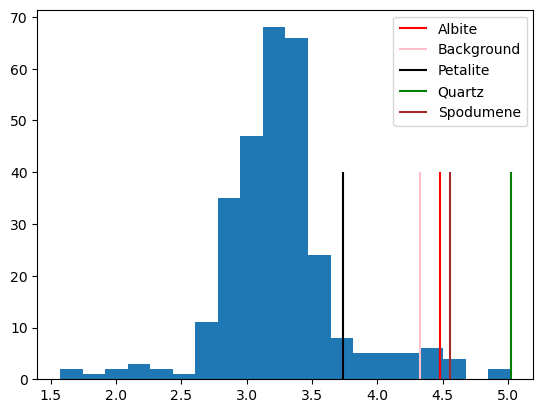

In [19]:
plt.hist(image_entropy,bins=20)
colors=['red','pink','black','green','brown']
for i in range(len(significant_w)):
    plt.vlines(image_entropy[significant_w[i]],0,40,color=colors[i],label=mineral_list[i])
    
plt.legend()

Text(0, 0.5, 'Map entropy')

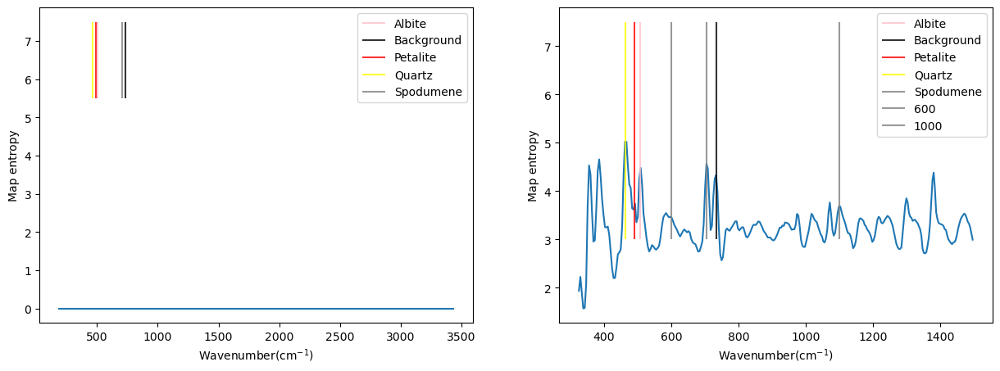

In [20]:
minerals = {
    
    'Albite':[508.1],
    'Background':[733.1],
    'Petalite':[491.3],
    'Quartz':[463.92],
    'Spodumene':[704.5]}

mineral_list = list(minerals.keys())

data_resh=pro_data_norm.reshape(250*100,-1)
entropy_total=np.zeros(data_resh.shape[1])
for i in range(data_resh.shape[1]):
    entropy_total[i]=entropy_calc(data_resh[i])
fig,ax=subplots(1,2,figsize=(15,5))

ax[0].plot(wavelengths_raman, entropy_total)
ax[0].vlines(minerals['Albite'],5.5,7.5,color='pink',alpha=0.8,label='Albite')
ax[0].vlines(minerals['Background'],5.5,7.5,color='black',alpha=0.8,label='Background')
ax[0].vlines(minerals['Petalite'],5.5,7.5,color='red',alpha=0.8,label='Petalite')
ax[0].vlines(minerals['Quartz'],5.5,7.5,color='yellow',alpha=0.8,label='Quartz')
ax[0].vlines(minerals['Spodumene'],5.5,7.5,color='grey',alpha=0.8,label='Spodumene')
ax[0].legend()

ax[0].set_xlabel(r'Wavenumber(cm$^{-1}$)')
ax[0].set_ylabel('Map entropy')

ax[1].plot(wavelengths, image_entropy)
ax[1].vlines(minerals['Albite'],3,7.5,color='pink',alpha=0.8,label='Albite')
ax[1].vlines(minerals['Background'],3,7.5,color='black',alpha=0.8,label='Background')
ax[1].vlines(minerals['Petalite'],3,7.5,color='red',alpha=0.8,label='Petalite')
ax[1].vlines(minerals['Quartz'],3,7.5,color='yellow',alpha=0.8,label='Quartz')
ax[1].vlines(minerals['Spodumene'],3,7.5,color='grey',alpha=0.8,label='Spodumene')

ax[1].vlines(600,3,7.5,color='grey',alpha=0.8,label='600')

ax[1].vlines(1100,3,7.5,color='grey',alpha=0.8,label='1000')
ax[1].legend()

ax[1].set_xlabel(r'Wavenumber(cm$^{-1}$)')
ax[1].set_ylabel('Map entropy')


50.99490856748235


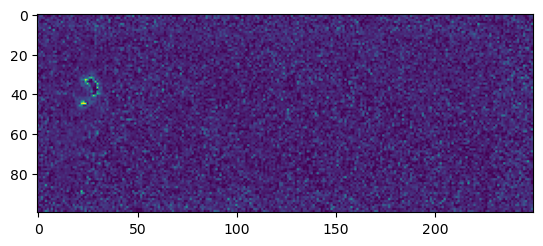

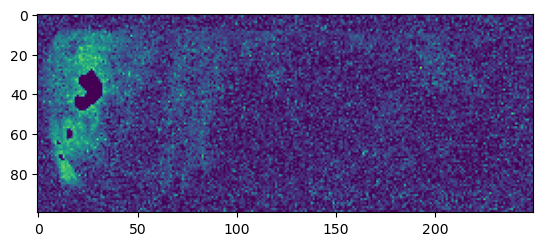

In [21]:
imshow(entropy_masks[find_index(wavelengths,600)].reshape(250,100).T)
print(np.max(entropy_masks[100]))
plt.show()
imshow(entropy_masks[find_index(wavelengths,1100)].reshape(250,100).T)

Text(0, 0.5, 'Map entropy')

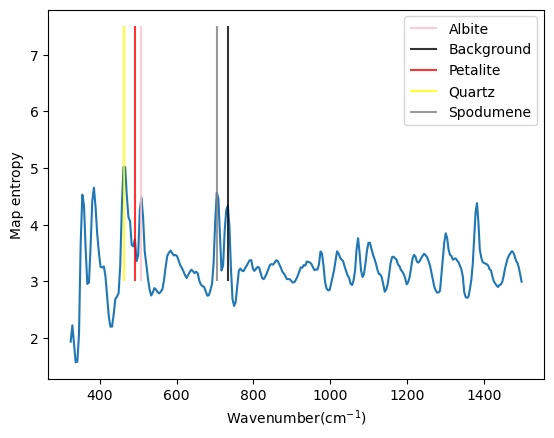

In [22]:
plt.plot(wavelengths, image_entropy)
plt.vlines(minerals['Albite'],3,7.5,color='pink',alpha=0.8,label='Albite')
plt.vlines(minerals['Background'],3,7.5,color='black',alpha=0.8,label='Background')
plt.vlines(minerals['Petalite'],3,7.5,color='red',alpha=0.8,label='Petalite')
plt.vlines(minerals['Quartz'],3,7.5,color='yellow',alpha=0.8,label='Quartz')
plt.vlines(minerals['Spodumene'],3,7.5,color='grey',alpha=0.8,label='Spodumene')
plt.legend()

plt.xlabel(r'Wavenumber(cm$^{-1}$)')
plt.ylabel('Map entropy')
#savefig('entropias.jpg',dpi=500)

## Entropias intermédias é a que mantém mais informação - ajustar a gama

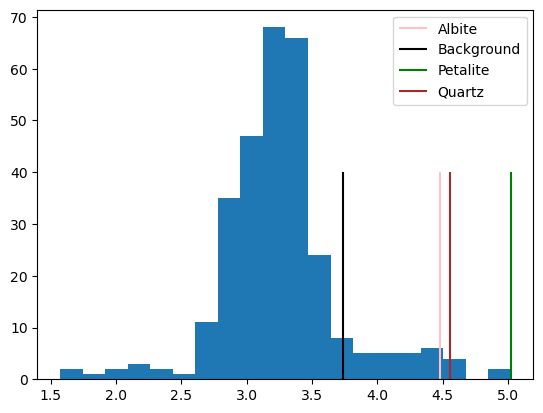

In [23]:
plt.hist(image_entropy,bins=20)
significant_w=[]
for i,mineral in enumerate(mineral_list):
    wn=find_index(wavelengths,minerals[mineral][0])
    significant_w.append(wn)
colors=['pink','black','green','brown']
significant_w.pop(1)
for i in range(len(significant_w)):
    plt.vlines(image_entropy[significant_w[i]],0,40,color=colors[i],label=mineral_list[i])
    
plt.legend()

In [24]:
relevant_entropies=[]
minerals = {
    
    'Albite':[508.1],
    'Background':[733.1],
    'Petalite':[491.3],
    'Quartz':[463.92],
    'Spodumene':[704.5]}

mineral_list = list(minerals.keys())




for i in significant_w:
    relevant_entropies.append(image_entropy[i])
    
max_en=np.max(relevant_entropies)+0.2
min_en=np.min(relevant_entropies)-0.2
#min_en=5.2
#max_en=6.3

new_maps_cut=[]
for i in range(entropy_masks.shape[0]):
    if min_en<=image_entropy[i]<=max_en:
        new_maps_cut.append(entropy_masks[i,:])
        
new_maps_cut=np.array(new_maps_cut)


C:\Users\Joana\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\Joana\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


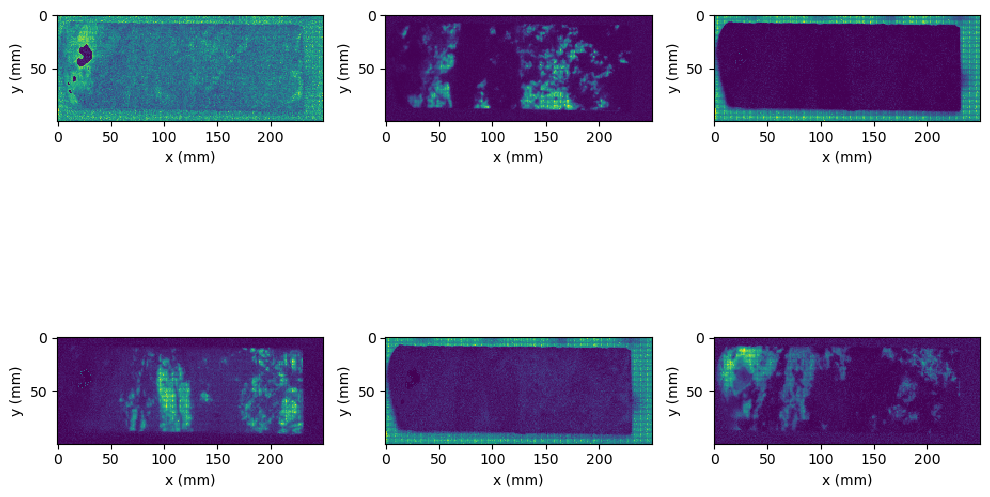

In [25]:
kmeans = sklearn.cluster.KMeans(n_clusters = 6,random_state=0)
a=kmeans.fit_predict(new_maps_cut)
labels = kmeans.labels_
fig, ax = subplots(2, 3, figsize = (10, 8))
# clusters_c = np.array(kmeans.cluster_centers_.cpu())
clusters_c = np.array(kmeans.cluster_centers_)

j = 0
l = 0

for i in range(len(np.unique(labels))):
    axs = ax[l, j]
    # axs.imshow(clusters_c[i].reshape(pro_data.shape[:2]).T, interpolation = 'none')
    axs.imshow(clusters_c[i].reshape(pro_data.shape[0], pro_data.shape[1]).T, interpolation = 'none')
    axs.set_ylabel('y (mm)')
    axs.set_xlabel('x (mm)')
    axs.grid(False)
    j += 1
    if j == 3:
        j = 0
        l += 1

fig.tight_layout()

In [26]:
## mantendo so as energias maximas
relevant_entropies=[]
for i in significant_w:
    relevant_entropies.append(image_entropy[i])
    
max_en=np.max(relevant_entropies)+0.2
min_en=np.min(relevant_entropies)-0.2
#min_en=5.2
#max_en=6.3

new_maps_cut=[]
for i in range(entropy_masks.shape[0]):
    if min_en<=image_entropy[i]:
        new_maps_cut.append(entropy_masks[i,:])
        
new_maps_cut=np.array(new_maps_cut)

C:\Users\Joana\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\Joana\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


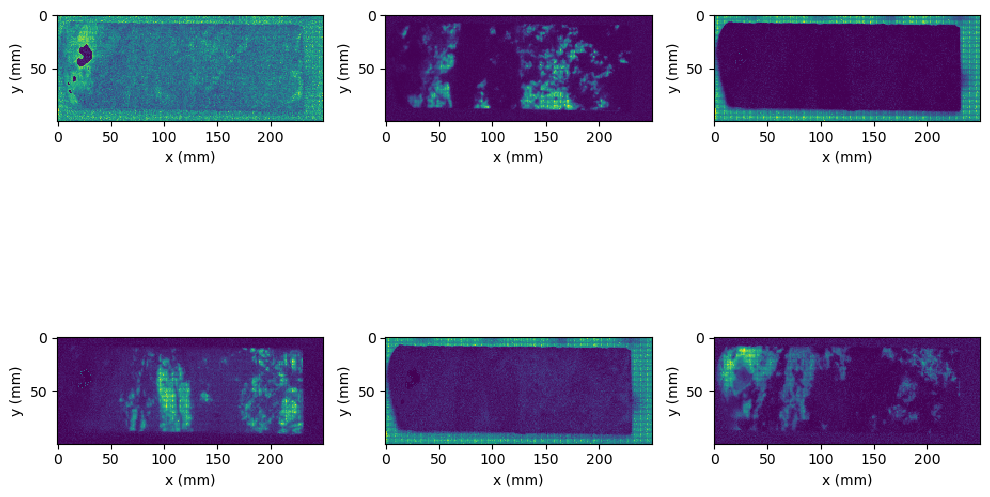

In [27]:
kmeans = sklearn.cluster.KMeans(n_clusters = 6,random_state=0)
a=kmeans.fit_predict(new_maps_cut)
labels = kmeans.labels_
fig, ax = subplots(2, 3, figsize = (10, 8))
# clusters_c = np.array(kmeans.cluster_centers_.cpu())
clusters_c = np.array(kmeans.cluster_centers_)

j = 0
l = 0

for i in range(len(np.unique(labels))):
    axs = ax[l, j]
    # axs.imshow(clusters_c[i].reshape(pro_data.shape[:2]).T, interpolation = 'none')
    axs.imshow(clusters_c[i].reshape(pro_data.shape[0], pro_data.shape[1]).T, interpolation = 'none')
    axs.set_ylabel('y (mm)')
    axs.set_xlabel('x (mm)')
    axs.grid(False)
    j += 1
    if j == 3:
        j = 0
        l += 1

fig.tight_layout()

## com filtro gaussiano

In [70]:
from scipy.ndimage import gaussian_filter
mask_t_g=gaussian_filter(mask_t,sigma=0.2)


mask_min_max = np.array([(mask_t_g[i, :] - mask_t_g[:, :].min()+ 1e-5)/(mask_t_g[:, :].max() - mask_t_g[:, :].min() + 1e-5) for i in range(mask_t.shape[0])])

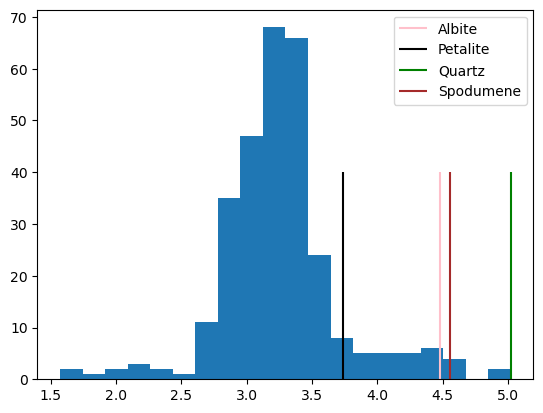

In [71]:
entropy_masks=mask_min_max*255

image_entropy=[]
for i in range(297):
    map_gr=entropy_masks[i]
    image_entropy.append(entropy_calc(map_gr))

    

    
plt.hist(image_entropy,bins=20)
significant_w=[]
for i,mineral in enumerate(mineral_list):
    wn=find_index(wavelengths,minerals[mineral][0])
    significant_w.append(wn)
colors=['pink','black','green','brown','red']
#significant_w.pop(1)
for i in range(len(significant_w)):
    plt.vlines(image_entropy[significant_w[i]],0,40,color=colors[i],label=mineral_list[i])
    
plt.legend()

In [101]:
entropy_masks.shape

(297, 25000)

In [102]:
wavelengths.shape

(297,)

In [103]:
## mantendo so as energias maximas
relevant_entropies=[]
for i in significant_w:
    relevant_entropies.append(image_entropy[i])
    
max_en=np.max(relevant_entropies)+0.2
min_en=np.min(relevant_entropies)-0.05
#min_en=5.2
#max_en=6.3
wav_cut=[]
new_maps_cut=[]
for i in range(entropy_masks.shape[0]):
    if min_en<=image_entropy[i]:
        new_maps_cut.append(entropy_masks[i,:])
        wav_cut.append(wavelengths[i])
        
new_maps_cut=np.array(new_maps_cut)

C:\Users\Joana\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\Joana\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


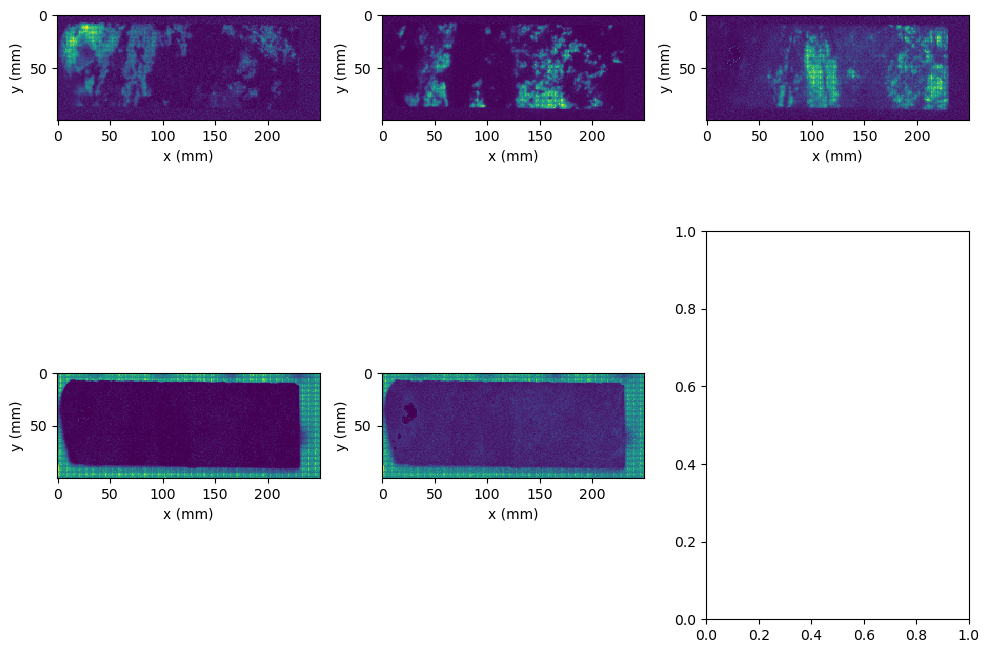

In [73]:
kmeans = sklearn.cluster.KMeans(n_clusters = 5,random_state=2)
a=kmeans.fit_predict(new_maps_cut)
labels = kmeans.labels_
fig, ax = subplots(2, 3, figsize = (10, 8))
# clusters_c = np.array(kmeans.cluster_centers_.cpu())
clusters_c = np.array(kmeans.cluster_centers_)

j = 0
l = 0

for i in range(len(np.unique(labels))):
    axs = ax[l, j]
    # axs.imshow(clusters_c[i].reshape(pro_data.shape[:2]).T, interpolation = 'none')
    axs.imshow(clusters_c[i].reshape(pro_data.shape[0], pro_data.shape[1]).T, interpolation = 'none')
    axs.set_ylabel('y (mm)')
    axs.set_xlabel('x (mm)')
    axs.grid(False)
    j += 1
    if j == 3:
        j = 0
        l += 1

fig.tight_layout()

## Aplicando thresholds antes do clustering

C:\Users\Joana\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\Joana\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


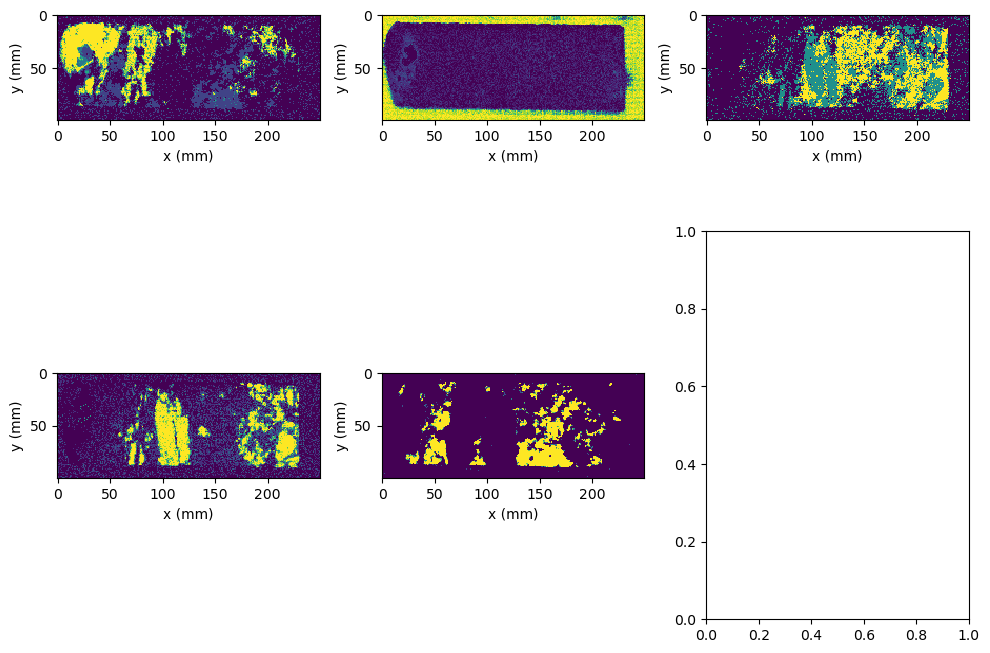

In [74]:
from skimage.filters import threshold_otsu
import cv2
thresholds=np.array([threshold_otsu(new_maps_cut[i]) for i in range(new_maps_cut.shape[0])])

maps_thres=[]
for i in range(new_maps_cut.shape[0]):
    c_mask=np.zeros(new_maps_cut.shape[1])
    for j in range(new_maps_cut.shape[1]):
        if new_maps_cut[i][j]>thresholds[i]:
            c_mask[j]=1
    maps_thres.append(c_mask)
maps_thres=np.array(maps_thres)  

kmeans = sklearn.cluster.KMeans(n_clusters = 5,random_state=0)
a=kmeans.fit_predict(maps_thres)
labels = kmeans.labels_
fig, ax = subplots(2, 3, figsize = (10, 8))
# clusters_c = np.array(kmeans.cluster_centers_.cpu())
clusters_c = np.array(kmeans.cluster_centers_)

j = 0
l = 0

for i in range(len(np.unique(labels))):
    axs = ax[l, j]
    # axs.imshow(clusters_c[i].reshape(pro_data.shape[:2]).T, interpolation = 'none')
    axs.imshow(clusters_c[i].reshape(pro_data.shape[0], pro_data.shape[1]).T, interpolation = 'none')
    axs.set_ylabel('y (mm)')
    axs.set_xlabel('x (mm)')
    axs.grid(False)
    j += 1
    if j == 3:
        j = 0
        l += 1

fig.tight_layout()


In [75]:
clusters_c[0]

array([0. , 0. , 0.2, ..., 0. , 0. , 0. ])

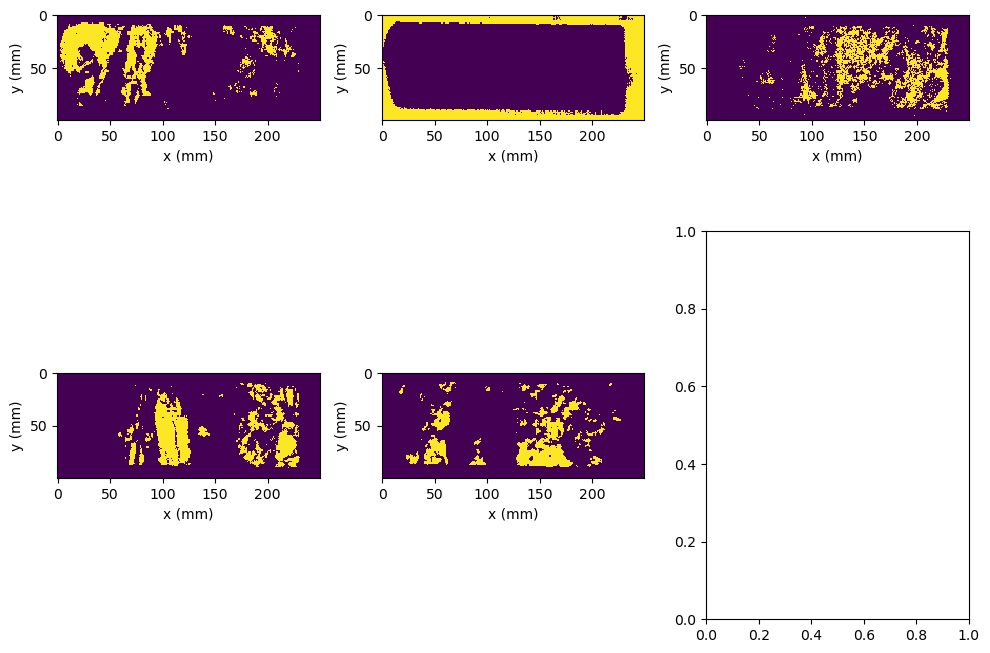

In [76]:
clusters_c = np.array(kmeans.cluster_centers_)
for i in range(clusters_c.shape[0]):
    for j in range(clusters_c.shape[1]):
        if clusters_c[i][j]<0.6:
            clusters_c[i][j]=0
        else:
            clusters_c[i][j]=1

fig, ax = subplots(2, 3, figsize = (10, 8))

j = 0
l = 0

for i in range(len(np.unique(labels))):
    axs = ax[l, j]
    # axs.imshow(clusters_c[i].reshape(pro_data.shape[:2]).T, interpolation = 'none')
    axs.imshow(clusters_c[i].reshape(pro_data.shape[0], pro_data.shape[1]).T, interpolation = 'none')
    axs.set_ylabel('y (mm)')
    axs.set_xlabel('x (mm)')
    axs.grid(False)
    j += 1
    if j == 3:
        j = 0
        l += 1

fig.tight_layout()

            

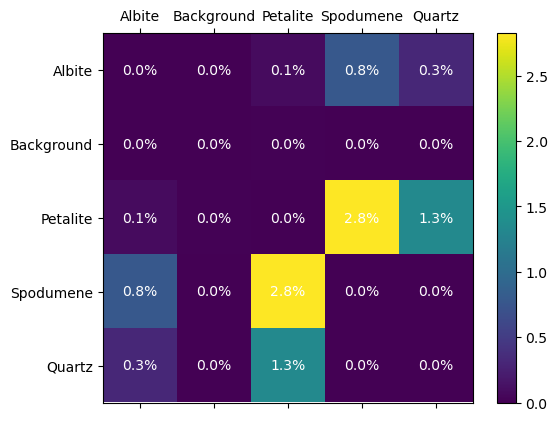

In [77]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

num_images = np.array(clusters_c).shape[0]
minerals_order=['Albite','Background','Petalite','Spodumene','Quartz']

confusion_matrix = np.zeros((num_images, num_images))

for i in range(num_images):
    for j in range(i + 1, num_images):
        img_and = cv2.bitwise_and(clusters_c[i], clusters_c[j])
        
        overlap_value = np.sum(img_and) /(img_and.shape[0]*img_and.shape[1])*100

        confusion_matrix[i, j] = overlap_value
        confusion_matrix[j, i] = overlap_value

fig, ax = plt.subplots()
cax = ax.matshow(confusion_matrix)

ax.set_xticks(range(num_images))
ax.set_yticks(range(num_images))
ax.set_xticklabels(minerals_order)
ax.set_yticklabels(minerals_order)
for i in range(num_images):
    for j in range(num_images):
        plt.text(j, i, f'{confusion_matrix[i, j]:.1f}'+'%', ha='center', va='center', color='w')

fig.colorbar(cax)
plt.show()

Área de cobertura 79.0 %


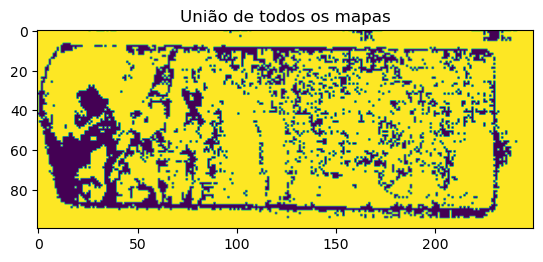

In [78]:
img_or = clusters_c[0]

for img in clusters_c[1:]:
    img_or = cv2.bitwise_or(img_or, img)
    
imshow(img_or.reshape(250,100).T)
plt.title('União de todos os mapas')
cut_int=img_or.copy()
print('Área de cobertura',round(sum(cut_int)/(cut_int.shape[0]*cut_int.shape[1]),2)*100, '%')

C:\Users\Joana\AppData\Local\Temp\ipykernel_19160\992665942.py:11: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  centre_circle = plt.Circle((0, 0), color='white', edgecolor='black', linewidth=0.9)


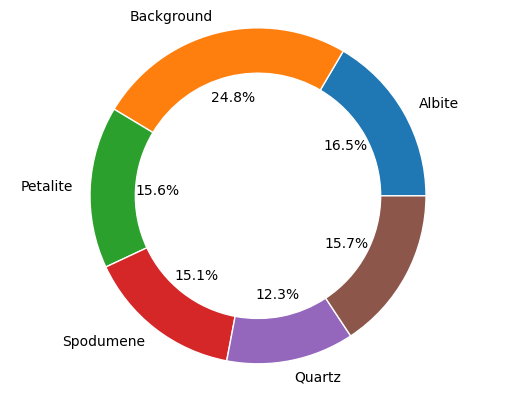

In [79]:
fig_ar=pro_data.shape[0]*pro_data.shape[1]
areas=[]
minerals_order=['Albite','Background','Petalite','Spodumene','Quartz','']
for i in range (len(clusters_c)):
    a=np.sum(clusters_c[i])
    areas.append(a)
areas.append((fig_ar-np.sum(areas)))
fig, ax = plt.subplots()


centre_circle = plt.Circle((0, 0), color='white', edgecolor='black', linewidth=0.9)
ax.add_artist(centre_circle)

ax.pie(areas, labels=minerals_order, autopct='%1.1f%%', wedgeprops=dict(width=0.27, edgecolor='w'))
ax.axis('equal')  
plt.show()


## Classificação por overlap

In [80]:
def intersection_maps(maps):
    img_and = maps[0]

    for img in maps[1:]:
        img_and = cv2.bitwise_and(img_and, img)
    return img_and
int_all=[]
for i in range(clusters_c.shape[0]):
    int_s=[]
    for j in range(new_maps_cut.shape[0]):
        int_s.append(sum(intersection_maps([clusters_c[i],maps_thres[j]]))/sum(clusters_c[i]))
    int_all.append(int_s)
    
int_all=np.array(int_all)
int_all.shape

(5, 32)

In [81]:
contain=np.zeros([int_all.shape[0],int_all.shape[1]])
for i in range(int_all.shape[0]):
    for j in range(int_all.shape[1]):
        if int_all[i][j]>0.6:
            contain[i][j]=1

In [82]:
contain.shape

(5, 32)

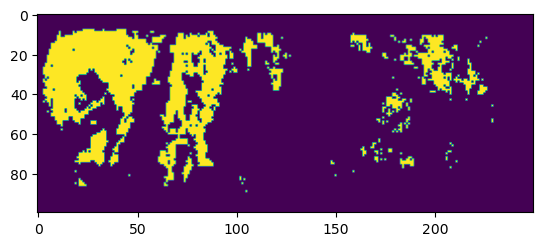

In [83]:
imshow(clusters_c[0].reshape(250,100).T)

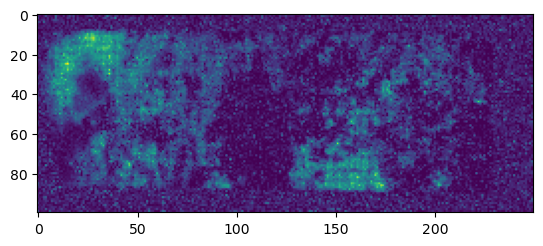

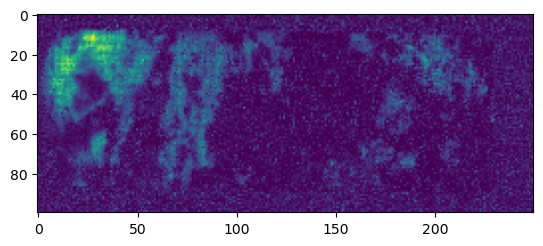

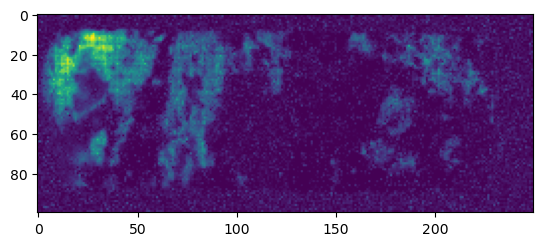

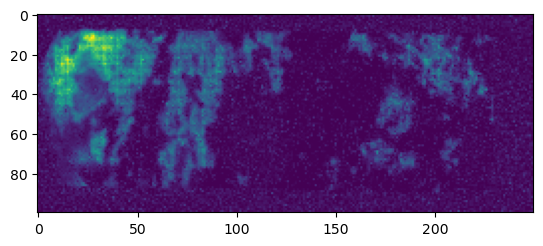

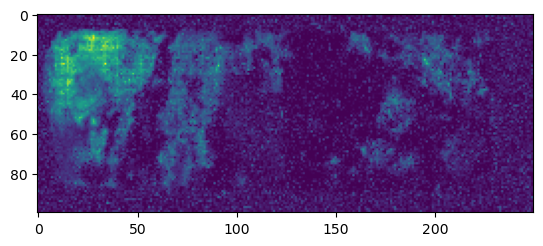

In [84]:
for i in range(contain.shape[1]):
    if contain[0][i]==1:
        imshow(new_maps_cut[i].reshape(250,100).T)
        plt.show()

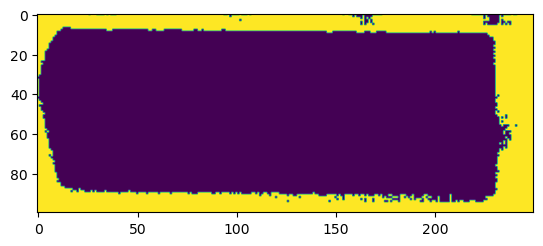

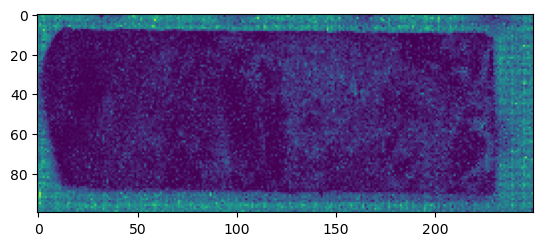

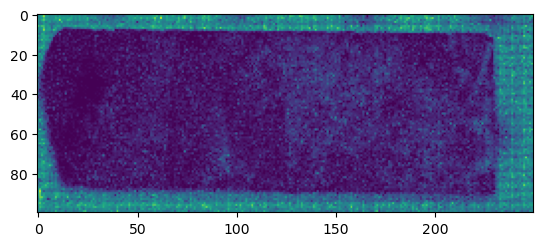

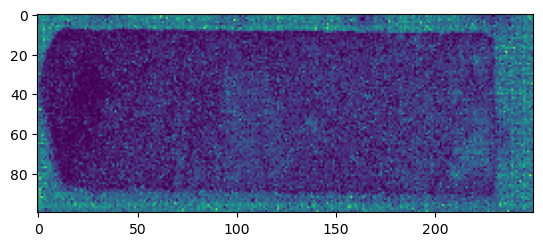

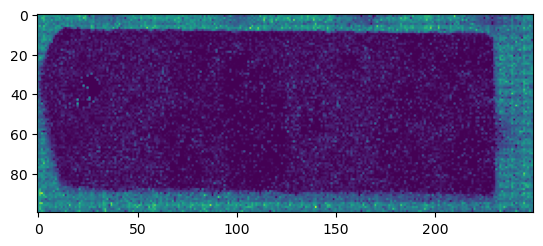

...

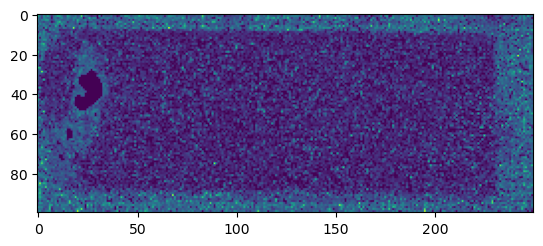

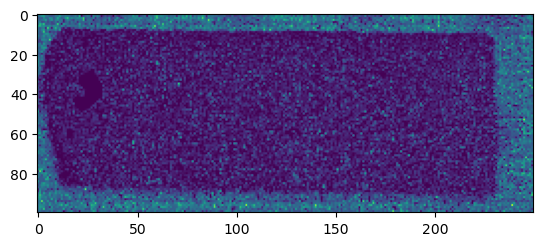

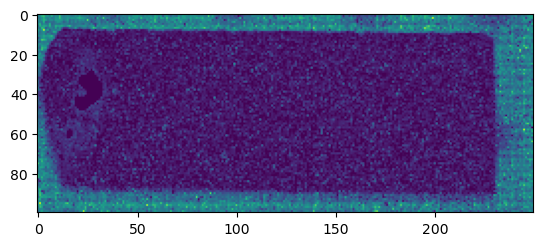

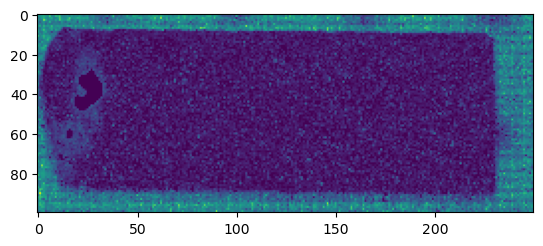

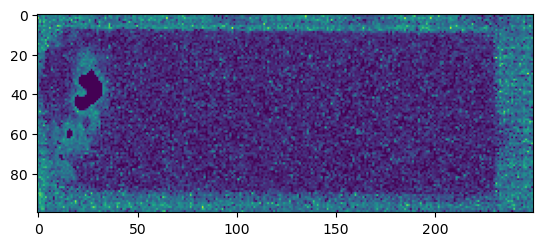

In [85]:
imshow(clusters_c[1].reshape(250,100).T)
plt.show()
for i in range(contain.shape[1]):
    if contain[1][i]==1:
        imshow(new_maps_cut[i].reshape(250,100).T)
        plt.show()

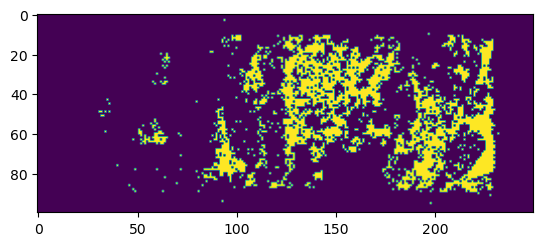

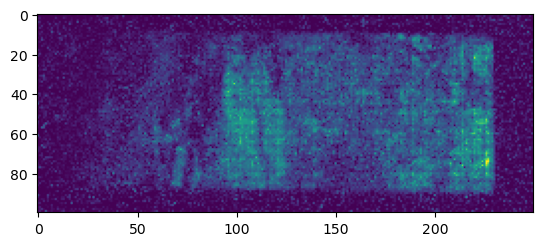

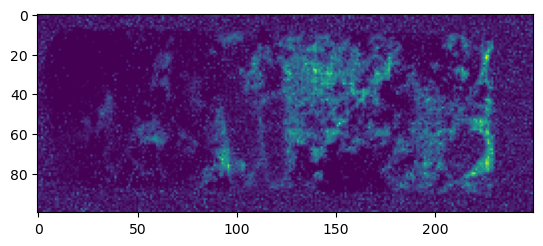

In [44]:
imshow(clusters_c[2].reshape(250,100).T)
plt.show()
for i in range(contain.shape[1]):
    if contain[2][i]==1:
        imshow(new_maps_cut[i].reshape(250,100).T)
        plt.show()

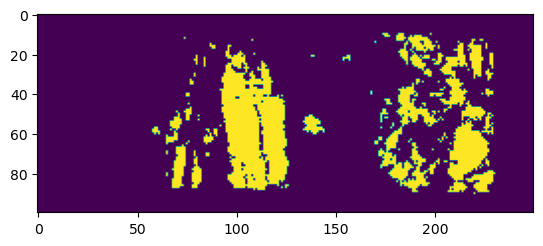

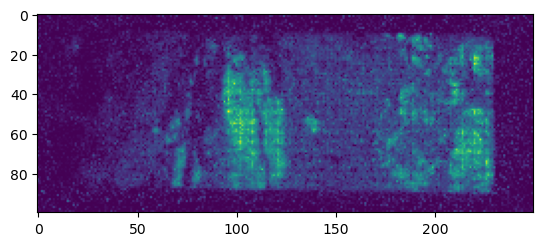

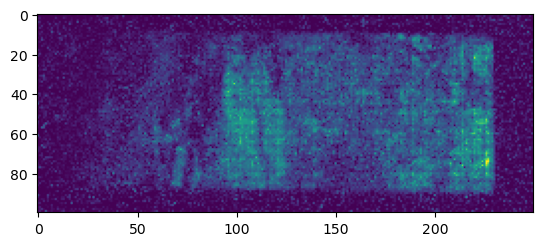

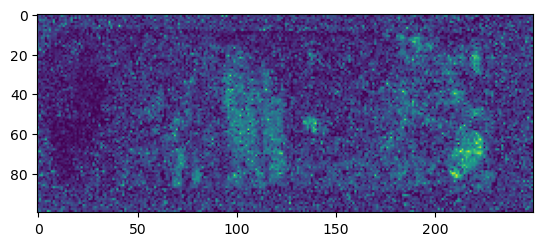

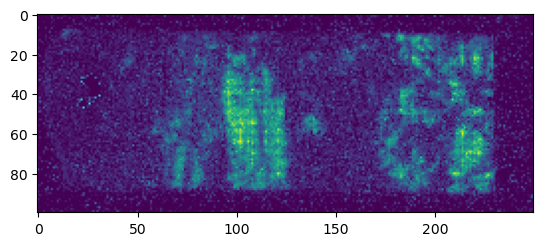

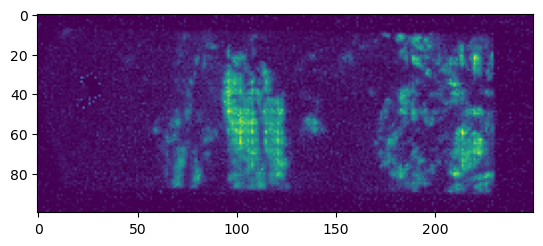

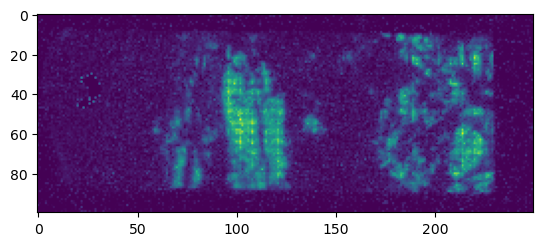

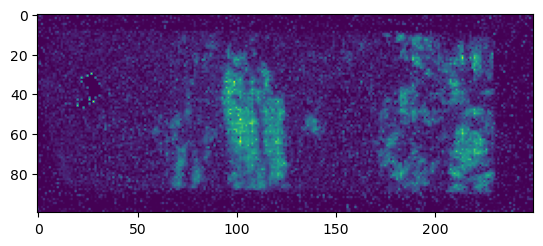

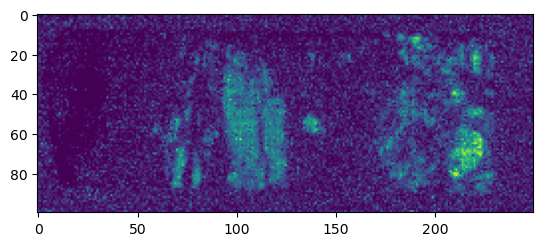

In [86]:
imshow(clusters_c[3].reshape(250,100).T)
plt.show()
for i in range(contain.shape[1]):
    if contain[3][i]==1:
        imshow(new_maps_cut[i].reshape(250,100).T)
        plt.show()

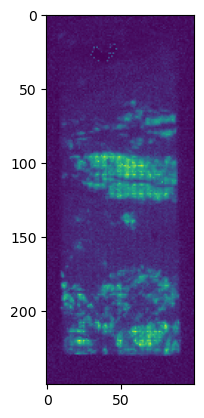

In [46]:
maps_1=[]
weigths_1=[]
for i in range(contain.shape[1]):
    if contain[3][i]==1:
        maps_1.append(new_maps_cut[i])
        weigths_1.append(int_all[3][i])

norm_wei=np.array(weigths_1)/(np.sum(weigths_1))

clus_1=np.zeros(new_maps_cut[i].shape)
for i in range(norm_wei.shape[0]):
    clus_1+=norm_wei[i]*maps_1[i]
imshow(clus_1.reshape(250,100))

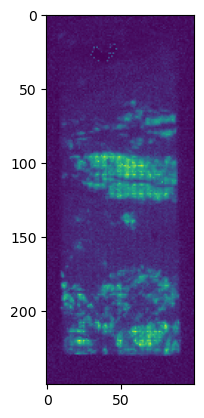

In [87]:
imshow(clus_1.reshape(250,100))

Raman bands
[474.9448505646287, 479.18977619464385, 504.60788827831675, 508.8356542465317, 513.060963566546]
Raman bands
[380.94017751912907, 385.23858143269536, 389.5345703979219, 725.2668313108752, 729.362840598731, 733.4563377696013, 737.5473220145541, 1296.4214550707184, 1300.1459373155903, 1303.867865737464, 1374.0995342250571, 1377.7704283827716, 1381.4387733255044, 1385.104569327439]
Raman bands
[359.4119898435638, 491.909863506864]
Raman bands
[355.09913005971976, 359.4119898435638, 393.8281428326882, 700.6380674831562, 704.7491320157078, 708.8576894611997, 712.9637389601976, 1072.1537104451563]
Raman bands
[457.9407019202208, 462.1954032270896, 466.4476626994219, 470.6974789407468, 474.9448505646287]


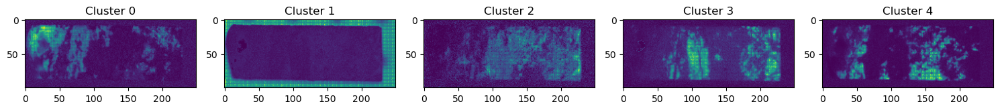

In [108]:
import matplotlib.pyplot as plt

# Assuming you have a total of 5 types of clusters
fig, axes = plt.subplots(1, 5, figsize=(15, 3))  # 1 row, 5 columns for subplots
clusters_o=[]
for cluster_type, ax in enumerate(axes):
    maps = []
    weights = []
    bands=[]
    for i in range(contain.shape[1]):
        if contain[cluster_type][i] == 1:
            maps.append(new_maps_cut[i])
            weights.append(int_all[cluster_type][i])
            bands.append(wav_cut[i])
    norm_weights = np.array(weights) / np.sum(weights)

    cluster = np.zeros(new_maps_cut[0].shape)
    for i in range(norm_weights.shape[0]):
        cluster += norm_weights[i] * maps[i]
    
    # Display the cluster in the corresponding subplot
    ax.imshow(cluster.reshape(250, 100).T)
    ax.set_title(f'Cluster {cluster_type}')
    clusters_o.append(cluster)
    print('Raman bands')
    print(bands)
    
plt.tight_layout()
plt.show()


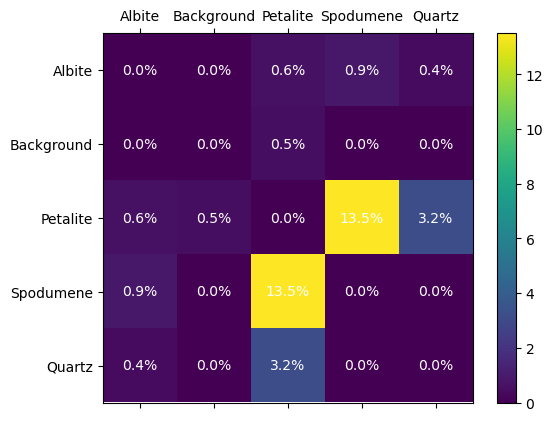

In [91]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

clusters_o=np.array(clusters_o)

thresholds=np.array([threshold_otsu(clusters_o[i]) for i in range(clusters_o.shape[0])])

clusters_thres=[]
for i in range(clusters_o.shape[0]):
    c_mask=np.zeros(clusters_o.shape[1])
    for j in range(clusters_o.shape[1]):
        if clusters_o[i][j]>thresholds[i]:
            c_mask[j]=1
    clusters_thres.append(c_mask)
clusters_thres=np.array(clusters_thres)  

num_images = np.array(clusters_o).shape[0]
minerals_order=['Albite','Background','Petalite','Spodumene','Quartz']

confusion_matrix = np.zeros((num_images, num_images))

for i in range(num_images):
    for j in range(i + 1, num_images):
        img_and = cv2.bitwise_and(clusters_thres[i], clusters_thres[j])
        
        overlap_value = np.sum(img_and) /(img_and.shape[0]*img_and.shape[1])*100

        confusion_matrix[i, j] = overlap_value
        confusion_matrix[j, i] = overlap_value

fig, ax = plt.subplots()
cax = ax.matshow(confusion_matrix)

ax.set_xticks(range(num_images))
ax.set_yticks(range(num_images))
ax.set_xticklabels(minerals_order)
ax.set_yticklabels(minerals_order)
for i in range(num_images):
    for j in range(num_images):
        plt.text(j, i, f'{confusion_matrix[i, j]:.1f}'+'%', ha='center', va='center', color='w')

fig.colorbar(cax)
plt.show()

C:\Users\Joana\AppData\Local\Temp\ipykernel_19160\853689638.py:13: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  centre_circle = plt.Circle((0, 0), color='white', edgecolor='black', linewidth=0.9)


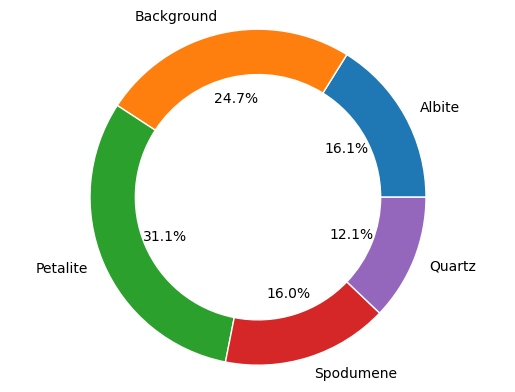

In [94]:
fig_ar=pro_data.shape[0]*pro_data.shape[1]
areas=[]
minerals_order=['Albite','Background','Petalite','Spodumene','Quartz']
for i in range (len(clusters_o)):
    a=np.sum(clusters_thres[i])
    areas.append(a)
if fig_ar>np.sum(areas):
    areas.append((fig_ar-np.sum(areas)))
    minerals_order.append(' ')
fig, ax = plt.subplots()


centre_circle = plt.Circle((0, 0), color='white', edgecolor='black', linewidth=0.9)
ax.add_artist(centre_circle)

ax.pie(areas, labels=minerals_order, autopct='%1.1f%%', wedgeprops=dict(width=0.27, edgecolor='w'))
ax.axis('equal')  
plt.show()


In [ ]:
import matplotlib.pyplot as plt

# Assuming you have a total of 5 types of clusters
fig, axes = plt.subplots(1, 5, figsize=(15, 3))  # 1 row, 5 columns for subplots
clusters_o=[]
for cluster_type, ax in enumerate(axes):
    maps = []
    weights = []
    
    for i in range(contain.shape[1]):
        if contain[cluster_type][i] == 1:
            maps.append(new_maps_cut[i])
            weights.append(int_all[cluster_type][i])

    norm_weights = np.array(weights) / np.sum(weights)

    cluster = np.zeros(new_maps_cut[0].shape)
    for i in range(norm_weights.shape[0]):
        cluster += norm_weights[i] * maps[i]
    
    # Display the cluster in the corresponding subplot
    ax.imshow(cluster.reshape(250, 100).T)
    ax.set_title(f'Cluster {cluster_type}')
    clusters_o.append(cluster)
plt.tight_layout()
plt.show()


In [97]:
new_maps_cut.shape

(32, 25000)

In [99]:
wavelengths_raman.shape

(1024,)

In [105]:
np.array(wav_cut).shape

(32,)

0.9670475684294444

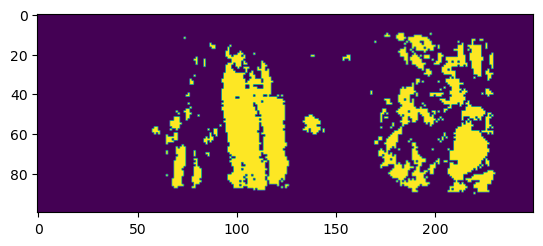

In [49]:
imshow(intersection_maps([clusters_c[3],maps_thres[0]]).reshape(250,100).T)

sum(intersection_maps([clusters_c[3],maps_thres[0]])/(sum(clusters_c[3])))

In [50]:
from itertools import combinations
 
def generate_combinations(n, j):
    indices = list(range(n))
    combo_list = list(combinations(indices, j))
    combo_list_as_lists = [list(combo) for combo in combo_list]
   
    return combo_list_as_lists
 
n = 5  
j = 5
combinations_result = generate_combinations(n, j)

n = 5
j = 4 
combinations_result = generate_combinations(n, j)
print(combinations_result)
                      

[[0, 1, 2, 3], [0, 1, 2, 4], [0, 1, 3, 4], [0, 2, 3, 4], [1, 2, 3, 4]]


In [51]:
#interseção de todos
def intersection_maps(maps):
    img_and = maps[0]

    for img in maps[1:]:
        img_and = cv2.bitwise_and(img_and, img)
    return img_and

def union_maps(maps):
    img_or = maps[0]
    for img in maps[1:]:
        img_or = cv2.bitwise_or(img_or, img)
    return img_or

clusters_c=clusters_c.reshape(5,250,100)
int_todos=intersection_maps(clusters_c)
n = 5
j = 4 
combinations_result = generate_combinations(n, j) #5C4
new_base=[]
int_comb=[]
for i in combinations_result:
    maps=[]
    for j in range(len(combinations_result[0])):
        maps.append(clusters_c[i[j]])
        
    int_s=intersection_maps(maps)-int_todos
    int_comb.append(int_s)
I1=union_maps(int_comb)
n = 5
j = 3 
combinations_result = generate_combinations(n, j) #5C3
int_comb=[]
for i in combinations_result:
    maps=[]
    for j in range(len(combinations_result[0])):
        maps.append(clusters_c[i[j]])
        
    int_s=intersection_maps(maps)-I1
    int_comb.append(int_s)
I2=union_maps(int_comb)

n = 5
j = 2
combinations_result = generate_combinations(n, j)  #5C2
int_comb=[]
for i in combinations_result:
    maps=[]
    for j in range(len(combinations_result[0])):
        maps.append(clusters_c[i[j]])
        
    int_s=intersection_maps(maps)-I2
    int_comb.append(int_s)
I3=union_maps(int_comb)


I4=union_maps(clusters_c-I3) #5C1



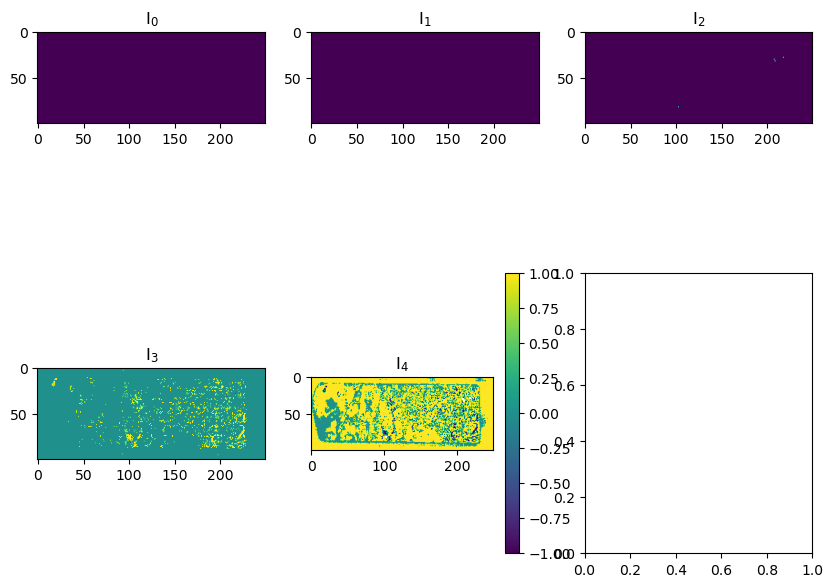

In [52]:
fig,ax=subplots(2,3,figsize=(10,8))
a=ax[0,0].imshow(int_todos.T)
ax[0,0].set_title(r'I$_0$')
b=ax[0,1].imshow(I1.T)
ax[0,1].set_title(r'I$_1$')
c=ax[0,2].imshow(I2.T)
ax[0,2].set_title(r'I$_2$')
d=ax[1,0].imshow(I3.T)
ax[1,0].set_title(r'I$_3$')
e=ax[1,1].imshow(I4.T)
ax[1,1].set_title(r'I$_4$')
fig.colorbar(e,orientation='vertical')

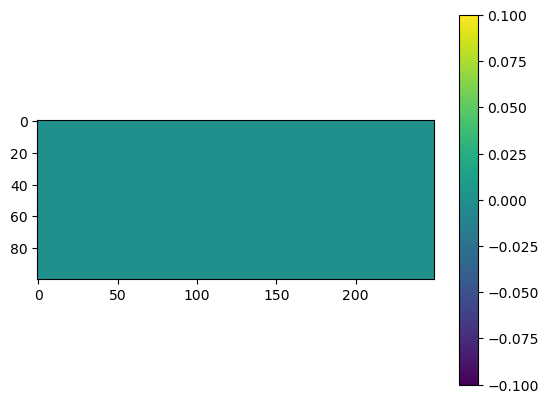

In [53]:
imshow(int_todos.T)
plt.colorbar()

In [54]:
np.dot(I3.flatten(),I4.flatten())

-inf

In [55]:
I4[np.where(I3!=0)]

array([-1., -1., -1., ..., -1., -1., -1.])

C:\Users\Joana\anaconda3\Lib\site-packages\skimage\filters\thresholding.py:757: RuntimeWarning: divide by zero encountered in log
  / (np.log(mean_back) - np.log(mean_fore)))


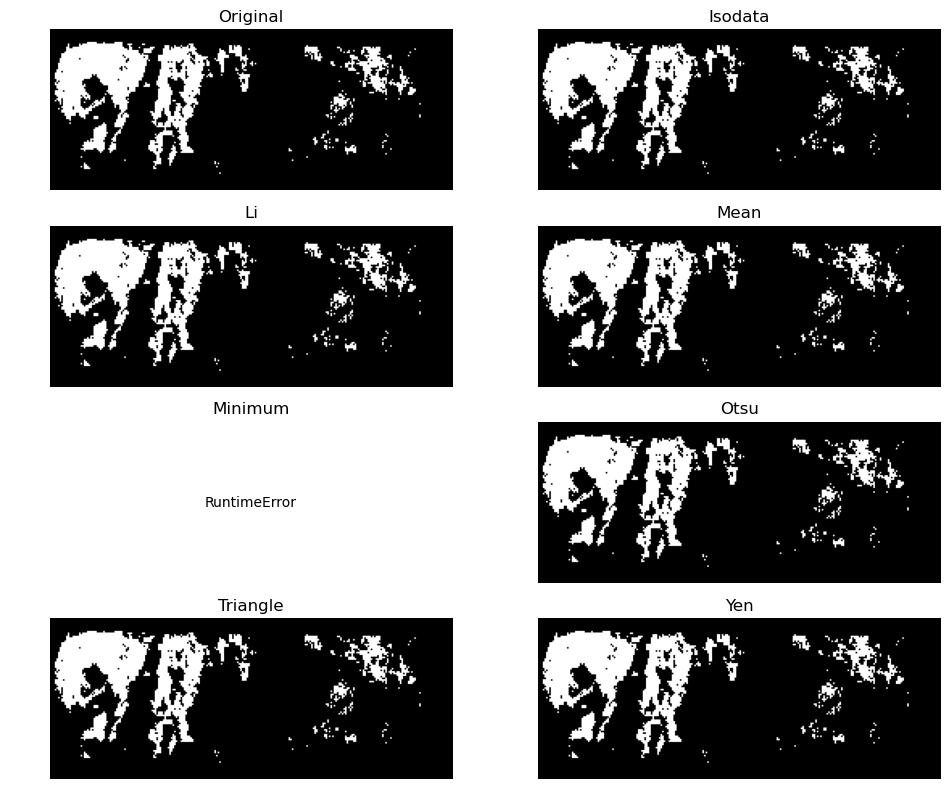

In [56]:
from skimage.filters import try_all_threshold
fig, ax = try_all_threshold(clusters_c[0].reshape(pro_data.shape[0], pro_data.shape[1]).T, figsize=(10, 8), verbose=False)
plt.show()

## dentro de uma parte da rocha

In [57]:
threshold = 1.27e-9

mask_offset = np.array(mask)
mask_t = np.array([(mask_offset[:, i])*((mask_offset[:, i] > threshold)) for i in range(mask_offset.shape[-1])])

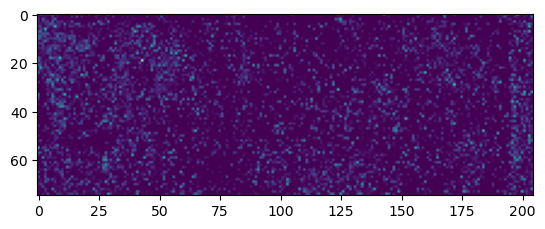

In [58]:
imshow(mask_t[13].reshape(250,100).T)
imshow(mask_t[2].reshape(250,100)[35:240,10:85].T)

cut_masks=np.array([mask_t[i].reshape(250,100)[40:230,10:85] for i in range(mask_t.shape[0])])
#cut_masks_f=cut_masks[:].reshape(-1)

In [59]:
cut_masks.shape
cut_masks_f=cut_masks.reshape(cut_masks.shape[0],cut_masks.shape[1]*cut_masks.shape[2])

In [60]:
mask_t_g=gaussian_filter(cut_masks_f,sigma=0.5)


mask_min_max = np.array([(mask_t_g[i, :] - mask_t_g[:, :].min()+ 1e-5)/(mask_t_g[:, :].max() - mask_t_g[:, :].min() + 1e-5) for i in range(mask_t.shape[0])])

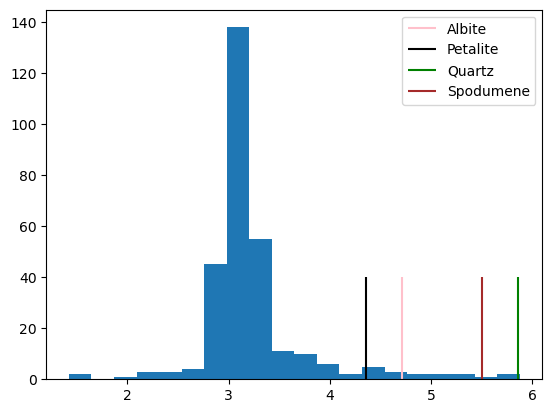

In [61]:
entropy_masks=mask_min_max*255

image_entropy=[]
for i in range(297):
    map_gr=entropy_masks[i]
    image_entropy.append(entropy_calc(map_gr))

    
minerals = {
    
    'Albite':[508.1],
    #'Background':[733.1],
    'Petalite':[491.3],
    'Quartz':[463.92],
    'Spodumene':[704.5]}

mineral_list = list(minerals.keys())
    
plt.hist(image_entropy,bins=20)
significant_w=[]
for i,mineral in enumerate(mineral_list):
    wn=find_index(wavelengths,minerals[mineral][0])
    significant_w.append(wn)
colors=['pink','black','green','brown','red']
#significant_w.pop(1)
for i in range(len(significant_w)):
    plt.vlines(image_entropy[significant_w[i]],0,40,color=colors[i],label=mineral_list[i])
    
plt.legend()

In [62]:
## mantendo so as energias maximas
relevant_entropies=[]
for i in significant_w:
    relevant_entropies.append(image_entropy[i])
    
max_en=np.max(relevant_entropies)+0.2
min_en=np.min(relevant_entropies)-0.2
#min_en=5.2
#max_en=6.3

new_maps_cut=[]
for i in range(entropy_masks.shape[0]):
    if min_en<=image_entropy[i]:
        new_maps_cut.append(entropy_masks[i,:])
        
new_maps_cut=np.array(new_maps_cut)

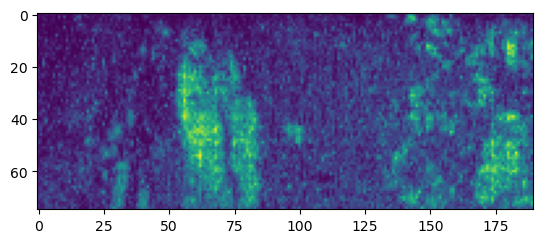

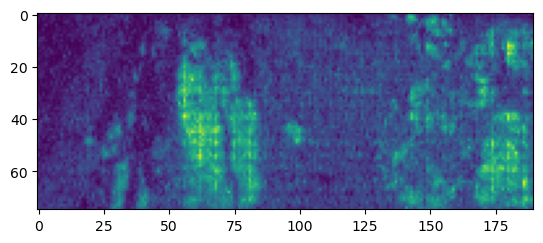

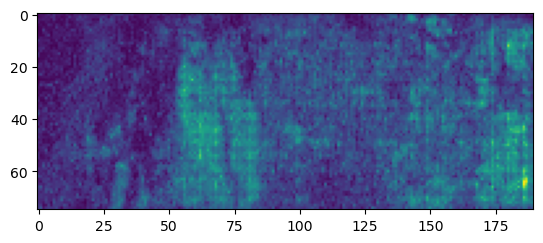

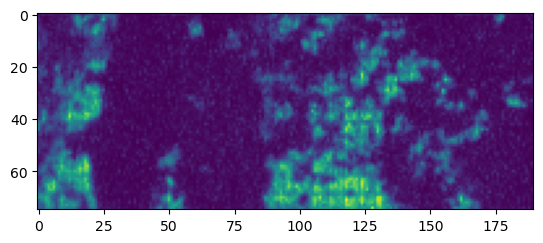

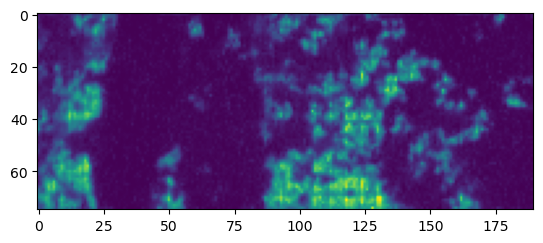

...

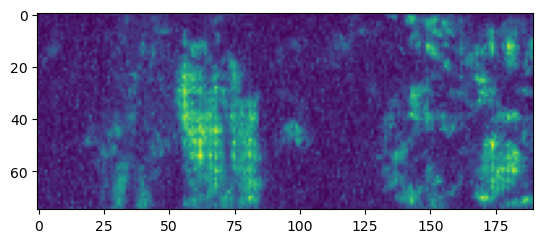

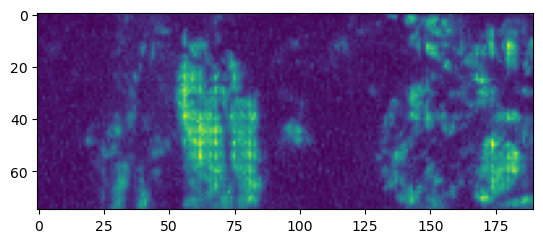

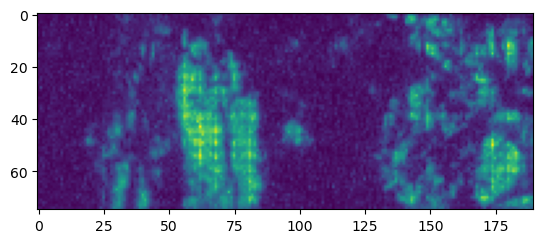

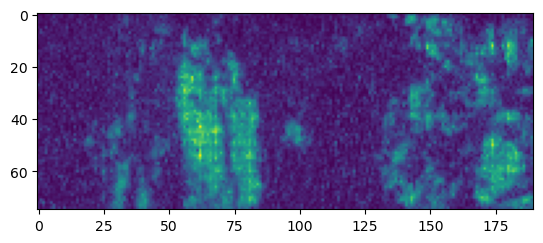

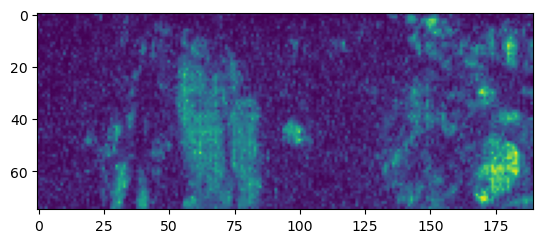

In [63]:
new_maps_cut.shape
for i in range(new_maps_cut.shape[0]):
    plt.imshow(new_maps_cut[i].reshape(cut_masks.shape[1],cut_masks.shape[2]).T)
    plt.show()

C:\Users\Joana\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\Joana\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


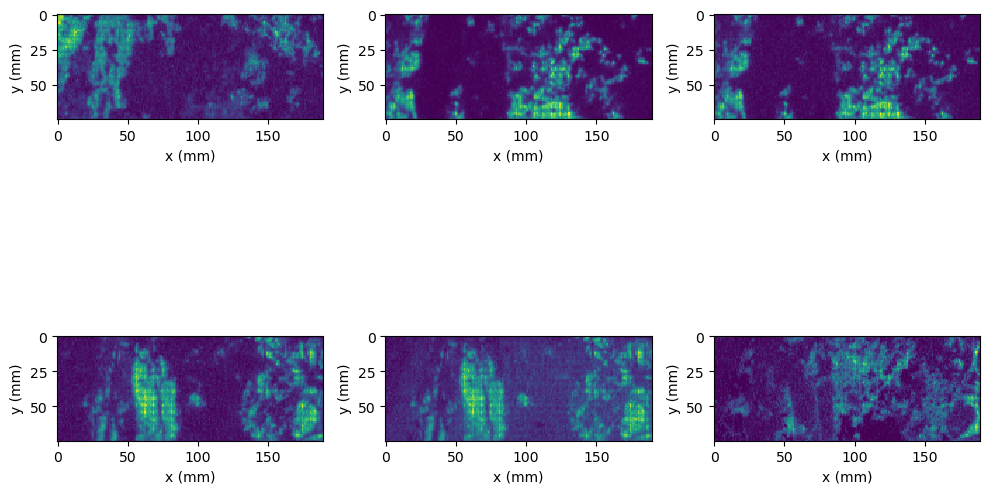

In [64]:
kmeans = sklearn.cluster.KMeans(n_clusters = 6,random_state=2)
a=kmeans.fit_predict(new_maps_cut)
labels = kmeans.labels_
fig, ax = subplots(2, 3, figsize = (10, 8))
# clusters_c = np.array(kmeans.cluster_centers_.cpu())
clusters_c = np.array(kmeans.cluster_centers_)

j = 0
l = 0

for i in range(len(np.unique(labels))):
    axs = ax[l, j]
    # axs.imshow(clusters_c[i].reshape(pro_data.shape[:2]).T, interpolation = 'none')
    axs.imshow(clusters_c[i].reshape(cut_masks.shape[1], cut_masks.shape[2]).T, interpolation = 'none')
    axs.set_ylabel('y (mm)')
    axs.set_xlabel('x (mm)')
    axs.grid(False)
    j += 1
    if j == 3:
        j = 0
        l += 1

fig.tight_layout()

C:\Users\Joana\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\Joana\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


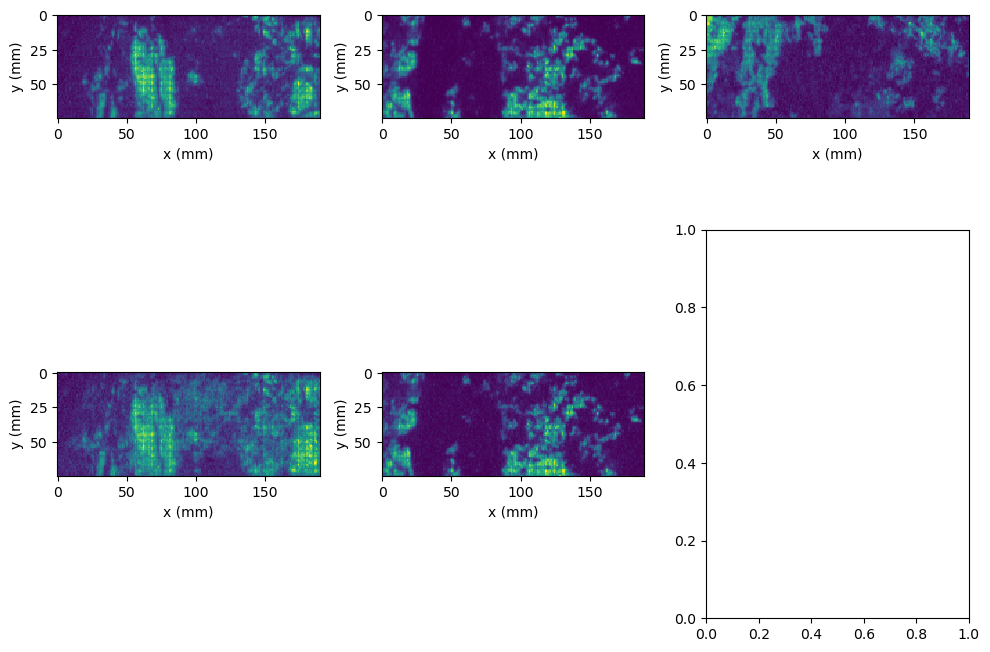

In [65]:
kmeans = sklearn.cluster.KMeans(n_clusters = 5)
a=kmeans.fit_predict(new_maps_cut)
labels = kmeans.labels_
fig, ax = subplots(2, 3, figsize = (10, 8))
# clusters_c = np.array(kmeans.cluster_centers_.cpu())
clusters_c = np.array(kmeans.cluster_centers_)

j = 0
l = 0

for i in range(len(np.unique(labels))):
    axs = ax[l, j]
    # axs.imshow(clusters_c[i].reshape(pro_data.shape[:2]).T, interpolation = 'none')
    axs.imshow(clusters_c[i].reshape(cut_masks.shape[1], cut_masks.shape[2]).T, interpolation = 'none')
    axs.set_ylabel('y (mm)')
    axs.set_xlabel('x (mm)')
    axs.grid(False)
    j += 1
    if j == 3:
        j = 0
        l += 1

fig.tight_layout()

## Reconstrução

In [66]:
clusters_c.shape

(5, 14250)

In [67]:
entropy_masks.shape

(297, 14250)

## unconstrained least squares

ValueError: cannot reshape array of size 14250 into shape (250,100)

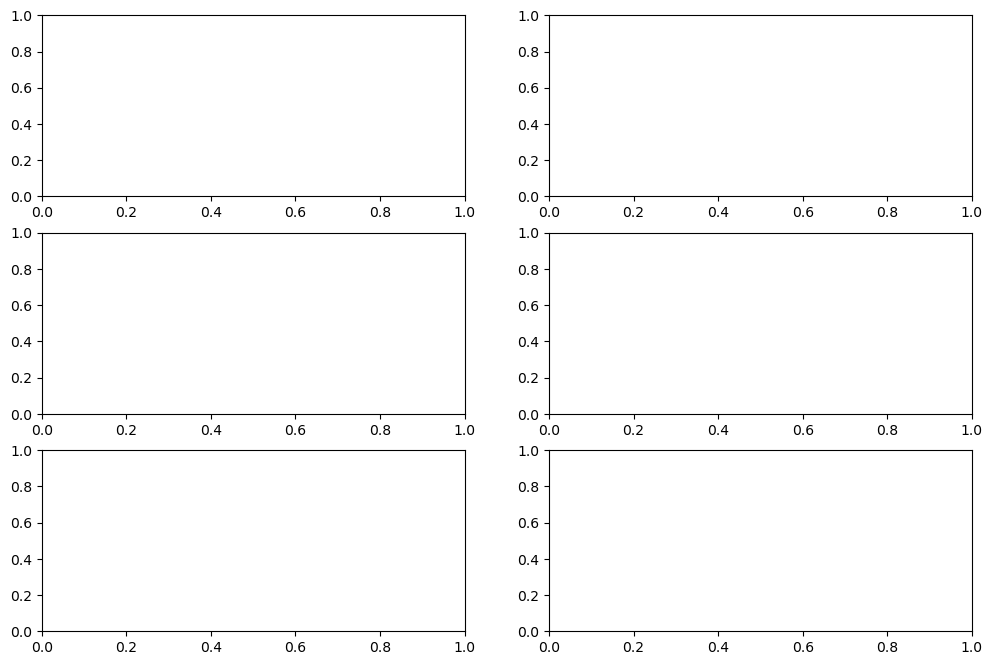

In [68]:
fig,ax=subplots(3,2,figsize=(12,8))
wn=20
weights=scipy.optimize.lsq_linear(clusters_c.T,entropy_masks[wn],tol=1).x
reconstructed=(np.dot(weights,clusters_c))


ax[0,0].imshow(reconstructed.reshape(250,100).T)
ax[0,0].set_title('Reconstructed map')
ax[0,1].imshow(entropy_masks[wn].reshape(250,100).T)
ax[0,1].set_title('Original map')


wn=significant_w[2]
weights=scipy.optimize.lsq_linear(clusters_c.T,entropy_masks[wn],tol=1e-15).x
reconstructed=(np.dot(weights,clusters_c))

ax[1,0].imshow(reconstructed.reshape(250,100).T)
ax[1,1].imshow(entropy_masks[wn].reshape(250,100).T)


wn=100
weights=scipy.optimize.lsq_linear(clusters_c.T,entropy_masks[wn],tol=1e-15,method='bvls').x
reconstructed=(np.dot(weights,clusters_c))

ax[2,0].imshow(reconstructed.reshape(250,100).T)
ax[2,1].imshow(entropy_masks[wn].reshape(250,100).T)

# Overlap 

In [ ]:
from skimage.filters import try_all_threshold

# Here, we specify a radius for local thresholding algorithms.
# If it is not specified, only global algorithms are called.
fig, ax = try_all_threshold(clusters_c[4].reshape(250,100).T, figsize=(10, 8), verbose=False)
plt.show()

In [ ]:
from skimage.filters import threshold_minimum

In [ ]:
thresholds=np.array([threshold_minimum(clusters_c[i]) for i in range(clusters_c.shape[0])])


In [ ]:
clusters_c.shape

In [ ]:
cluster_thres=[]
for i in range(clusters_c.shape[0]):
    c_mask=np.zeros(clusters_c.shape[1])
    for j in range(clusters_c.shape[1]):
        if clusters_c[i][j]>thresholds[i]:
            c_mask[j]=1
    cluster_thres.append(c_mask.reshape(250,100).T)
    

In [ ]:
import cv2
img_or = cv2.bitwise_or(cluster_thres[0],cluster_thres[2]) #união

img_and = cv2.bitwise_and(cluster_thres[0],cluster_thres[2]) #interseção
imshow(img_and)
cluster_thres=np.array(cluster_thres)

In [ ]:
import cv2
import matplotlib.pyplot as plt

# Assuming cluster_thres is a NumPy array containing your images

# Create a subplot with enough space for all the intersections
num_images = cluster_thres.shape[0]
num_subplots = num_images * (num_images - 1) // 2
#fig, axes = plt.subplots(num_subplots, figsize=(20, 18))
#minerals_order=['Fluorescence','Quartz','Petalite','Albite','Spodumene']

minerals_order=['geral','Spodumene','Fluorescence','Petalite','Albite','Quartz']
# Flatten the axes array to simplify indexing
#axes = axes.flatten()

# Counter for the subplot index
subplot_index = 0

# Iterate through each pair of images
for i in range(num_images):
    for j in range(i + 1, num_images):
        # Calculate the intersection using cv2.bitwise_and
        img_and = cv2.bitwise_and(cluster_thres[i], cluster_thres[j])
        
        # Plot the intersection in the current subplot
        plt.imshow(img_and)
        plt.title(f'Intersection {minerals_order[i]} and {minerals_order[j]}')
        plt.axis('off')
        plt.show()
        
        # Increment subplot index
        subplot_index += 1

# Adjust layout for better visualization
plt.tight_layout()
plt.show()




In [ ]:
import cv2

#uniao de todos os mapas

img_or = cluster_thres[0]

for img in cluster_thres[1:]:
    img_or = cv2.bitwise_or(img_or, img)
    
imshow(img_or)

In [ ]:
#uniao de todos os mapas
cut_int=img_or.copy()
print(sum(cut_int)/(cut_int.shape[0]*cut_int.shape[1])*100, '%')
#mapas cobrem aprox 53% da imagem  %93 era antes com o da petalite

In [ ]:
img_and = cluster_thres[0]
#interseção de todos os mapas
for img in cluster_thres[1:]:
    img_and = cv2.bitwise_and(img_and, img)
    
imshow(img_and)

## Old

In [ ]:
kmeans = sklearn.cluster.KMeans(n_clusters = 4)
a=kmeans.fit_predict(new_maps_cut)
labels = kmeans.labels_
fig, ax = subplots(2, 2, figsize = (10, 8))
# clusters_c = np.array(kmeans.cluster_centers_.cpu())
clusters_c = np.array(kmeans.cluster_centers_)

j = 0
l = 0

for i in range(len(np.unique(labels))):
    axs = ax[l, j]
    # axs.imshow(clusters_c[i].reshape(pro_data.shape[:2]).T, interpolation = 'none')
    axs.imshow(clusters_c[i].reshape(pro_data.shape[0], pro_data.shape[1]).T, interpolation = 'none')
    axs.set_ylabel('y (mm)')
    axs.set_xlabel('x (mm)')
    axs.grid(False)
    j += 1
    if j == 2:
        j = 0
        l += 1

fig.tight_layout()

## cortar o background e a fluorescencia

In [ ]:
maps=new_maps_cut

In [ ]:
reshaped_maps=maps.reshape(-1,250,100)

In [ ]:
reshaped_maps.shape

In [ ]:
maps_without_background_1=reshaped_maps[:,35:,:]
maps_without_background=maps_without_background_1.reshape(maps_without_background_1.shape[0],maps_without_background_1.shape[1]*maps_without_background_1.shape[2])


In [ ]:
maps_without_background.shape

In [ ]:
entropy_masks.shape

## classificação

In [ ]:
kmeans = sklearn.cluster.KMeans(n_clusters = 4)
a=kmeans.fit_predict(maps_without_background)
labels = kmeans.labels_
fig, ax = subplots(2, 2,figsize=(10,8))
# clusters_c = np.array(kmeans.cluster_centers_.cpu())
clusters_c = np.array(kmeans.cluster_centers_)

j = 0
l = 0

for i in range(len(np.unique(labels))):
    axs = ax[l, j]
    # axs.imshow(clusters_c[i].reshape(pro_data.shape[:2]).T, interpolation = 'none')
    axs.imshow(clusters_c[i].reshape(maps_without_background_1.shape[1], maps_without_background_1.shape[2]).T, interpolation = 'none')
    axs.set_ylabel('y (mm)')
    axs.set_xlabel('x (mm)')
    axs.grid(False)
    j += 1
    if j == 2:
        j = 0
        l += 1

fig.tight_layout()

In [ ]:
final_masks=clusters_c
fig,ax=subplots(3,2,figsize=(12,8))
wn=20
weights=scipy.optimize.lsq_linear(final_masks.T,maps_without_background[wn],tol=1e-15).x
reconstructed=(np.dot(weights,final_masks))


ax[0,0].imshow(reconstructed.reshape(maps_without_background_1.shape[1],maps_without_background_1.shape[2]).T)
ax[0,0].set_title('Reconstructed map')
ax[0,1].imshow(maps_without_background[wn].reshape(maps_without_background_1.shape[1],maps_without_background_1.shape[2]).T)
ax[0,1].set_title('Original map')


wn=significant_w[2]
weights=scipy.optimize.lsq_linear(final_masks.T,maps_without_background[wn],tol=1e-15).x
reconstructed=(np.dot(weights,final_masks))

ax[1,0].imshow(reconstructed.reshape(maps_without_background_1.shape[1],maps_without_background_1.shape[2]).T)
ax[1,1].imshow(maps_without_background[wn].reshape(maps_without_background_1.shape[1],maps_without_background_1.shape[2]).T)


wn=100
weights=scipy.optimize.lsq_linear(final_masks.T,maps_without_background[wn],tol=1e-15,method='bvls').x
reconstructed=(np.dot(weights,final_masks))

ax[2,0].imshow(reconstructed.reshape(maps_without_background_1.shape[1],maps_without_background_1.shape[2]).T)
ax[2,1].imshow(maps_without_background[wn].reshape(maps_without_background_1.shape[1],maps_without_background_1.shape[2]).T)

In [ ]:
def custom_chess_grid(nrows, ncols, square_height, square_length):
    matrix = np.zeros([nrows, ncols])

    for i in range(0, nrows, 2 * square_height):
        for j in range(0, ncols, 2 * square_length):
            matrix[i:i + square_height, j:j + square_length] = 1
            matrix[i + square_height:i + 2 * square_height, j + square_length:j + 2 * square_length] = 1

    return matrix

def visualize_mask(mask):
    plt.imshow(mask, cmap='gray', interpolation='nearest')
    plt.show()


In [ ]:
fig,ax=subplots(1,5,figsize=(12,5))

for i in range(len(significant_w)):
    ax[i].imshow(mask_min_max[significant_w[i]].reshape(250,100).T)

In [ ]:
nrows = maps_without_background_1.shape[2]
ncols = maps_without_background_1.shape[1]
chess_mask=custom_chess_grid(nrows,ncols,10,10)
visualize_mask(chess_mask)
line_mask=custom_chess_grid(nrows,ncols,200,10)
visualize_mask(line_mask)
hline_mask=custom_chess_grid(nrows,ncols,10,250)
visualize_mask(hline_mask)
large_chess_mask=custom_chess_grid(nrows,ncols,10,50)
visualize_mask(large_chess_mask)

different_masks=[chess_mask.flatten(),line_mask.flatten(),hline_mask.flatten(),large_chess_mask.flatten()]
#different_masks=[chess_mask.flatten(),line_mask.flatten(),hline_mask.flatten(),diagonal_grid.flatten()]

In [ ]:
kmeans = sklearn.cluster.KMeans(n_clusters = 4,init=different_masks)
a=kmeans.fit_predict(maps_without_background)
labels = kmeans.labels_
fig, ax = subplots(2, 2,figsize=(10,8))
# clusters_c = np.array(kmeans.cluster_centers_.cpu())
clusters_c = np.array(kmeans.cluster_centers_)

j = 0
l = 0

for i in range(len(np.unique(labels))):
    axs = ax[l, j]
    # axs.imshow(clusters_c[i].reshape(pro_data.shape[:2]).T, interpolation = 'none')
    axs.imshow(clusters_c[i].reshape(maps_without_background_1.shape[1], maps_without_background_1.shape[2]).T, interpolation = 'none')
    axs.set_ylabel('y (mm)')
    axs.set_xlabel('x (mm)')
    axs.grid(False)
    j += 1
    if j == 2:
        j = 0
        l += 1

fig.tight_layout()

# OLD

## classificação a usar todos os mapas com entropias equalizadas

In [ ]:
kmeans = sklearn.cluster.KMeans(n_clusters = 6)
a=kmeans.fit_predict(final_masks)
labels = kmeans.labels_
fig, ax = subplots(2, 3, figsize = (10, 8))
# clusters_c = np.array(kmeans.cluster_centers_.cpu())
clusters_c = np.array(kmeans.cluster_centers_)

j = 0
l = 0

for i in range(len(np.unique(labels))):
    axs = ax[l, j]
    # axs.imshow(clusters_c[i].reshape(pro_data.shape[:2]).T, interpolation = 'none')
    axs.imshow(clusters_c[i].reshape(pro_data.shape[0], pro_data.shape[1]).T, interpolation = 'none')
    axs.set_ylabel('y (mm)')
    axs.set_xlabel('x (mm)')
    axs.grid(False)
    j += 1
    if j == 3:
        j = 0
        l += 1

fig.tight_layout()

## cortar primeiro os mapas com entropias fora das zonas e depois fazer a equalização

In [ ]:
relevant_entropies=[]
for i in significant_w:
    relevant_entropies.append(image_entropy[i])
    
max_en=np.max(relevant_entropies)
min_en=np.min(relevant_entropies)

new_maps_cut=[]
for i in range(entropy_masks.shape[0]):
    if min_en<=image_entropy[i]<=max_en:
        new_maps_cut.append(entropy_masks[i,:])
        
new_maps_cut=np.array(new_maps_cut)


In [ ]:
#P=new_maps_cut.mean(axis=0)
P=np.random.random(25000)
#sorted_args=P.argsort()
P.sort()
final_masks=[]
for i in range(new_maps_cut.shape[0]):
    X=new_maps_cut[i].copy()
    #X.sort()
    sorted_args=X.argsort()
    new_X=np.ones(new_maps_cut.shape[1])
    for j in range(new_maps_cut.shape[1]):
        #new_X[j]=float(P[sorted_args[j]])
        new_X[sorted_args[j]]=P[j]
        
    #print(new_X)
    final_masks.append(new_X)
    
final_masks=np.array(final_masks)*255

In [ ]:
kmeans = sklearn.cluster.KMeans(n_clusters = 4)
a=kmeans.fit_predict(final_masks)
labels = kmeans.labels_
fig, ax = subplots(2, 2, figsize = (10, 8))
# clusters_c = np.array(kmeans.cluster_centers_.cpu())
clusters_c = np.array(kmeans.cluster_centers_)

j = 0
l = 0

for i in range(len(np.unique(labels))):
    axs = ax[l, j]
    # axs.imshow(clusters_c[i].reshape(pro_data.shape[:2]).T, interpolation = 'none')
    axs.imshow(clusters_c[i].reshape(pro_data.shape[0], pro_data.shape[1]).T, interpolation = 'none')
    axs.set_ylabel('y (mm)')
    axs.set_xlabel('x (mm)')
    axs.grid(False)
    j += 1
    if j == 2:
        j = 0
        l += 1

fig.tight_layout()